In [1]:
#Importing packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mlb
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
import folium
from sklearn.decomposition import FactorAnalysis
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error

In [2]:
# reading the description of the data
pd.options.display.max_colwidth=200
data_description = pd.read_excel('data_dictionary_Real_estate.xlsx',header=[1],index_col=[0])
data_description.head()

,Description
Variable,
UID,The ID of the location of which you are analyzing. ID location compatible across\nall Golden Oak Research Locations.
BLOCKID,Block ID of tract. If there is no specified block id the location is then a tract. The maximum number of blocks for any given track is 9.
COUNTYID,The County Code reported by the U.S. Census Bureau for the specified geographic location.
STATEID,The state code reported by the U.S. Census Bureau for the specified geographic location.
state,The state name reported by the U.S. Census Bureau for the specified geographic location.


In [3]:
# reading the train dataset
pd.set_option('display.max_columns',None)
train_df = pd.read_csv('train.csv')
train_df.head()

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,267822,NaN,140,53,36,New York,NY,Hamilton,Hamilton,City,tract,13346,315,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.00000,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770
1,246444,NaN,140,141,18,Indiana,IN,South Bend,Roseland,City,tract,46616,574,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.00000,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030
2,245683,NaN,140,63,18,Indiana,IN,Danville,Danville,City,tract,46122,317,39.792202,-86.515246,69561595.0,284193,6881,3643,3238,742.77365,703.0,323.39011,291.85520,378.0,0.95238,0.88624,0.79630,0.66667,0.39153,0.39153,0.28307,0.15873,459,378,84942.68317,74964.0,56811.62186,1155.20980,2488.0,95262.51431,85395.0,49292.67664,709.74925,1889.0,1506.06758,1361.0,731.89394,699.41354,1491.0,556.45986,532.0,184.42175,538.0,323.35354,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.94288,0.94616,0.93952,39.38154,40.83333,22.89769,888.29730,3643.0,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657
3,279653,NaN,140,127,72,Puerto Rico,PR,San Juan,Guaynabo,Urban,tract,927,787,18.396103,-66.104169,1105793.0,0,2700,1141,1559,803.42018,782.0,297.39258,259.30316,368.0,0.94693,0.87151,0.69832,0.61732,0.51397,0.46927,0.35754,0.32961,438,358,48733.67116,37845.0,45100.54010,928.32193,1267.0,56401.68133,44399.0,41082.90515,490.18479,729.0,1175.28642,1101.0,428.98751,261.28471,437.0,288.04047,247.0,185.55887,392.0,314.90566,0.01086,0.01086,0.01086,0.52714,0.53057,0.82530,0.73727,0.91500,0.90755,0.92043,48.64749,48.91667,23.05968,274.98956,1141.0,47.77526,50.58333,24.32015,362.20193,1559.0,0.65037,0.47257,0.02021,0.02021,0.10106
4,247218,NaN,140,161,20,Kansas,KS,Manhattan,Manhattan City,City,tract,66502,785,39.195573,-96.569366,2554403.0,0,5637,2586,3051,938.56493,881.0,392.44096,1005.42886,1704.0,0.99286,0.98247,0.91688,0.84740,0.78247,0.60974,0.55455,0.44416,1725,1540,31834.15466,22497.0,34046.50907,1548.67477,1983.0,54053.42396,50272.0,39609.12605,244.08903,395.0,1192.58759,1125.0,327.49674,76.61052,134.0,443.68855,444.0,76.12674,124.0,79.55556,0.05426,0.05426,0.05426,0.51938,0.18332,0.65545,0.7496

In [4]:
# reading the test dataset
test_df=pd.read_csv('test.csv')
test_df.head()

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
0,255504,NaN,140,163,26,Michigan,MI,Detroit,Dearborn Heights City,CDP,tract,48239,313,42.346422,-83.252823,2711280,39555,3417,1479,1938,858.57169,859.0,232.39082,276.07497,424.0,1.00000,0.95696,0.85316,0.85316,0.85316,0.85316,0.76962,0.63544,435,395,48899.52121,38746.0,44392.20902,798.02401,1180.0,53802.87122,45167.0,43756.56479,464.30972,769.0,1139.24548,1109.0,336.47710,262.67011,474.0,488.51323,436.0,192.75147,271.0,189.18182,0.06443,0.06443,0.07651,0.63624,0.14111,0.55087,0.51965,0.91047,0.92010,0.90391,33.37131,27.83333,22.36768,334.30978,1479.0,34.78682,33.75000,21.58531,416.48097,1938.0,0.70252,0.28217,0.05910,0.03813,0.14299
1,252676,NaN,140,1,23,Maine,ME,Auburn,Auburn City,City,tract,4210,207,44.100724,-70.257832,14778785,2705204,3796,1846,1950,832.68625,750.0,267.22342,183.32299,245.0,1.00000,1.00000,0.86611,0.67364,0.30962,0.30962,0.30962,0.27197,275,239,72335.33234,61008.0,51895.81159,922.82969,1722.0,85642.22095,74759.0,49156.72870,482.99945,1147.0,1533.25988,1438.0,536.61118,373.96188,937.0,661.31296,668.0,201.31365,510.0,279.69697,0.01175,0.01175,0.14375,0.64755,0.52310,0.26442,0.49359,0.94290,0.92832,0.95736,43.88680,46.08333,22.90302,427.10824,1846.0,44.23451,46.66667,22.37036,532.03505,1950.0,0.85128,0.64221,0.02338,0.00000,0.13377
2,276314,NaN,140,15,42,Pennsylvania,PA,Pine City,Millerton,Borough,tract,14871,607,41.948556,-76.783808,258903666,863840,3944,2065,1879,816.00639,755.0,416.25699,141.39063,217.0,0.97573,0.93204,0.78641,0.71845,0.63592,0.47573,0.43689,0.32524,245,206,58501.15901,51648.0,45245.27248,893.07759,1461.0,65694.06582,57186.0,44239.31893,619.73962,1084.0,1254.54462,1089.0,596.85204,340.45884,552.0,397.44466,356.0,189.40372,664.0,534.16737,0.01069,0.01316,0.06497,0.45395,0.51066,0.60484,0.83848,0.89238,0.86003,0.92463,39.81661,41.91667,24.29111,499.10080,2065.0,41.62426,44.50000,22.86213,453.11959,1879.0,0.81897,0.59961,0.01746,0.01358,0.10026
3,248614,NaN,140,231,21,Kentucky,KY,Monticello,Monticello City,City,tract,42633,606,36.746009,-84.766870,501694825,2623067,2508,1427,1081,418.68937,385.0,156.92024,88.95960,93.0,1.00000,0.93548,0.93548,0.64516,0.55914,0.46237,0.46237,0.36559,153,93,38237.55059,31612.0,34527.61607,775.17947,957.0,44156.38709,34687.0,34899.74300,535.21987,689.0,862.65763,749.0,624.42157,299.56752,337.0,200.88113,180.0,91.56490,467.0,454.85404,0.00995,0.00995,0.01741,0.41915,0.53770,0.80931,0.87403,0.60908,0.56584,0.65947,41.81638,43.00000,24.65325,333.57733,1427.0,44.81200,48.00000,21.03155,263.94320,1081.0,0.84609,0.56953,0.05492,0.04694,0.12489
4,286865,NaN,140,355,48,Texas,TX,Corpus Christi,Edroy,Town,tract,78410,361,27.882462,-97.678586,13796057,497689,6230,3274,2956,1031.63763,997.0,326.76727,277.39844,624.0,0.72276,0.66506,0.53526,0.38301,0.18910,0.16667,0.14263,0.11058,660,624,114456.07790,94211.0,81950.95692,836.30759,2404.0,123527.02420,103898.0,72173.55823,507.42257,1738.0,1996.41425,1907.0,740.21168,319.97570,1102.0,867.57713,804.0,376.20236,642.0,333.91919,0.00000,0.00000,0.03440,0.63188,1.000

### Understanding the data

In [5]:
#basic information about data
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27321 entries, 0 to 27320
Data columns (total 80 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   UID                          27321 non-null  int64  
 1   BLOCKID                      0 non-null      float64
 2   SUMLEVEL                     27321 non-null  int64  
 3   COUNTYID                     27321 non-null  int64  
 4   STATEID                      27321 non-null  int64  
 5   state                        27321 non-null  object 
 6   state_ab                     27321 non-null  object 
 7   city                         27321 non-null  object 
 8   place                        27321 non-null  object 
 9   type                         27321 non-null  object 
 10  primary                      27321 non-null  object 
 11  zip_code                     27321 non-null  int64  
 12  area_code                    27321 non-null  int64  
 13  lat             

In [6]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11709 entries, 0 to 11708
Data columns (total 80 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   UID                          11709 non-null  int64  
 1   BLOCKID                      0 non-null      float64
 2   SUMLEVEL                     11709 non-null  int64  
 3   COUNTYID                     11709 non-null  int64  
 4   STATEID                      11709 non-null  int64  
 5   state                        11709 non-null  object 
 6   state_ab                     11709 non-null  object 
 7   city                         11709 non-null  object 
 8   place                        11709 non-null  object 
 9   type                         11709 non-null  object 
 10  primary                      11709 non-null  object 
 11  zip_code                     11709 non-null  int64  
 12  area_code                    11709 non-null  int64  
 13  lat             

In [7]:
#shape of the train dataset
print('There are {} rows and {} columns in the train data'.format(*train_df.shape))

There are 27321 rows and 80 columns in the train data


In [8]:
#shape of the test dataset
print('There are {} rows and {} columns in the test data'.format(*test_df.shape))

There are 11709 rows and 80 columns in the test data


In [9]:
# add below feature to train and test datasets before combining them
train_df['Belongs_to']='train_df'
test_df['Belongs_to']='test_df'

In [10]:
#Comining train and test datasets to perform pre-processing steps
data = pd.concat([train_df,test_df])
data.tail(3)

,UID,BLOCKID,SUMLEVEL,COUNTYID,STATEID,state,state_ab,city,place,type,primary,zip_code,area_code,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,Belongs_to
11706,250127,NaN,140,9,25,Massachusetts,MA,Lawrence,Methuen Town City,City,tract,1841,978,42.737778,-71.131761,5225804.0,393810,7392,3669,3723,1069.70567,1138.0,488.13975,207.29615,506.0,0.85375,0.83004,0.77273,0.56324,0.47431,0.33399,0.30237,0.02569,539,506,89549.15374,75357.0,66560.76837,1339.55365,2739.0,99484.96572,89050.0,62721.62266,853.61856,1986.0,1791.63902,1794.0,656.68467,548.16568,1634.0,654.78088,612.0,256.84182,566.0,299.83838,0.02727,0.02727,0.13545,0.74273,0.37297,0.29411,0.26972,0.94057,0.94000,0.94105,35.85743,34.91667,22.49430,880.48254,3669.0,43.53905,43.66667,23.17995,900.13903,3723.0,0.84372,0.50269,0.00108,0.00108,0.07294,test_df
11707,241096,NaN,140,27,19,Iowa,IA,Carroll,Carroll City,City,tract,51401,712,42.081366,-94.866175,11066759.0,0,5945,2732,3213,696.93368,576.0,595.16228,503.83775,590.0,0.96886,0.92042,0.83045,0.69723,0.62284,0.43772,0.33737,0.33737,663,578,57877.26387,41838.0,49745.93715,1605.79897,2596.0,75066.29009,72135.0,47200.66016,782.93088,1568.0,1182.30365,1059.0,587.01032,796.11244,1267.0,369.29903,334.0,133.20792,666.0,556.40404,0.03570,0.03570,0.07967,0.65546,0.30010,0.53579,0.47507,0.91407,0.92428,0.90634,39.18219,40.25000,24.86317,636.20201,2732.0,45.63179,48.16667,24.84209,693.82905,3213.0,0.83330,0.66699,0.02738,0.00000,0.04694,test_df
11708,287763,NaN,140,453,48,Texas,TX,Austin,Sunset Valley City,Town,tract,78745,512,30.219013,-97.774728,1990126.0,0,4117,2070,2047,950.09294,864.0,333.82364,417.07457,675.0,1.00000,0.97481,0.86074,0.73926,0.44593,0.38370,0.27852,0.25778,682,675,58006.33817,44179.0,49189.98590,902.67611,1396.0,54913.24441,42469.0,41016.08651,581.04758,877.0,1364.17379,1318.0,463.57052,217.49287,456.0,550.78197,555.0,199.13527,258.0,163.55556,0.00000,0.00000,0.05042,0.63866,1.00000,0.67315,0.51407,0.78685,0.80615,0.76820,35.56404,35.00000,21.67509,522.45931,2070.0,35.99955,35.41667,20.68049,559.30291,2047.0,0.52587,0.51922,0.08066,0.02520,0.10586,test_df


In [11]:
#information of the data
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39030 entries, 0 to 11708
Data columns (total 81 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   UID                          39030 non-null  int64  
 1   BLOCKID                      0 non-null      float64
 2   SUMLEVEL                     39030 non-null  int64  
 3   COUNTYID                     39030 non-null  int64  
 4   STATEID                      39030 non-null  int64  
 5   state                        39030 non-null  object 
 6   state_ab                     39030 non-null  object 
 7   city                         39030 non-null  object 
 8   place                        39030 non-null  object 
 9   type                         39030 non-null  object 
 10  primary                      39030 non-null  object 
 11  zip_code                     39030 non-null  int64  
 12  area_code                    39030 non-null  int64  
 13  lat             

In [12]:
#Null values in the dataset
data.isnull().sum().sort_values(ascending=False)[:60]

BLOCKID                        39030
hc_sample_weight                 890
hc_samples                       890
hc_stdev                         890
hc_median                        890
hc_mean                          890
hc_mortgage_stdev                841
hc_mortgage_mean                 841
hc_mortgage_samples              841
hc_mortgage_sample_weight        841
hc_mortgage_median               841
second_mortgage_cdf              677
debt_cdf                         677
home_equity_cdf                  677
debt                             677
home_equity_second_mortgage      677
second_mortgage                  677
home_equity                      677
rent_gt_10                       463
rent_gt_50                       463
rent_gt_40                       463
rent_gt_35                       463
rent_gt_25                       463
rent_gt_20                       463
rent_gt_15                       463
rent_gt_30                       463
rent_samples                     462
r

In [13]:
# Setting index with UID feature
data= data.set_index('UID')

In [14]:
#droping the non useful feature for our analysis. These features are identified with our domain knowledge 
data.drop(columns=['SUMLEVEL','BLOCKID','COUNTYID','STATEID','state_ab','primary','zip_code','area_code'],axis=1,inplace=True)

In [15]:
# Columns in the data
data.columns

Index(['state', 'city', 'place', 'type', 'lat', 'lng', 'ALand', 'AWater',
       'pop', 'male_pop', 'female_pop', 'rent_mean', 'rent_median',
       'rent_stdev', 'rent_sample_weight', 'rent_samples', 'rent_gt_10',
       'rent_gt_15', 'rent_gt_20', 'rent_gt_25', 'rent_gt_30', 'rent_gt_35',
       'rent_gt_40', 'rent_gt_50', 'universe_samples', 'used_samples',
       'hi_mean', 'hi_median', 'hi_stdev', 'hi_sample_weight', 'hi_samples',
       'family_mean', 'family_median', 'family_stdev', 'family_sample_weight',
       'family_samples', 'hc_mortgage_mean', 'hc_mortgage_median',
       'hc_mortgage_stdev', 'hc_mortgage_sample_weight', 'hc_mortgage_samples',
       'hc_mean', 'hc_median', 'hc_stdev', 'hc_samples', 'hc_sample_weight',
       'home_equity_second_mortgage', 'second_mortgage', 'home_equity', 'debt',
       'second_mortgage_cdf', 'home_equity_cdf', 'debt_cdf', 'hs_degree',
       'hs_degree_male', 'hs_degree_female', 'male_age_mean',
       'male_age_median', 'male_age_stdev

In [16]:
# Printing categories/object features and their unique values
for i in data.columns[data.dtypes=='object']:
    print(i+":")
    print(data[i].unique())
    print(f"No. of unquie values: {data[i].nunique()}")
    print()

state:
['New York' 'Indiana' 'Puerto Rico' 'Kansas' 'Alabama' 'Texas'
 'South Carolina' 'California' 'Arkansas' 'Maryland' 'Illinois' 'Iowa'
 'Tennessee' 'Nevada' 'Louisiana' 'Colorado' 'Rhode Island' 'Mississippi'
 'New Jersey' 'Oregon' 'Arizona' 'Florida' 'Wisconsin' 'Pennsylvania'
 'North Carolina' 'Virginia' 'Michigan' 'Ohio' 'Oklahoma' 'Georgia'
 'Idaho' 'South Dakota' 'Minnesota' 'Missouri' 'Washington' 'Wyoming'
 'Connecticut' 'West Virginia' 'Kentucky' 'Massachusetts'
 'District of Columbia' 'Hawaii' 'Montana' 'Alaska' 'New Hampshire' 'Utah'
 'Vermont' 'Nebraska' 'North Dakota' 'New Mexico' 'Maine' 'Delaware']
No. of unquie values: 52

city:
['Hamilton' 'South Bend' 'Danville' ... 'Pfafftown' 'Jarvisburg'
 'Clementon']
No. of unquie values: 8172

place:
['Hamilton' 'Roseland' 'Danville' ... 'Grayslake' 'Clementon'
 'Carroll City']
No. of unquie values: 11856

type:
['City' 'Urban' 'Town' 'CDP' 'Village' 'Borough']
No. of unquie values: 6

Belongs_to:
['train_df' 'test_df']
No. 

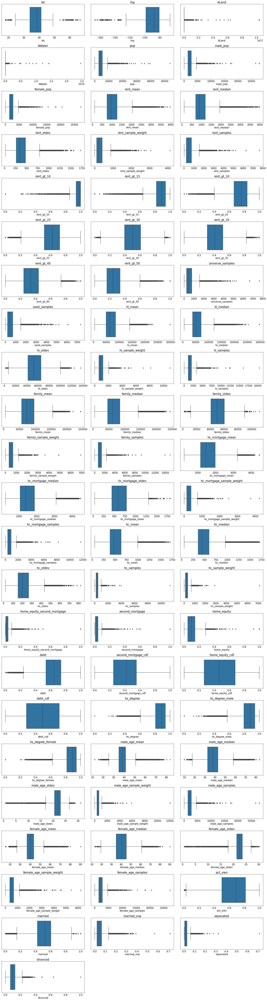

In [18]:
# Visualizing outliers in the dataset
plt.figure(figsize=(25,100))
mlb.rcParams.update({'font.size': 16})
for i,col in enumerate(data.columns[data.dtypes!='object']):
    ax=plt.subplot(25,3,i+1)
    sns.boxplot(data=data,x=col,ax=ax)
    plt.title(col)
plt.tight_layout()
plt.show()
    
    

In [19]:
#Removing outliers from the dataset
def Outliers_removal(data):
    if data[col].dtype!=object:
        Q1=data[col].quantile(0.25)
        Q3=data[col].quantile(0.75)
        IQR = Q3-Q1
        data=data[(data[col]>=data[col]-1.5*IQR) & (data[col]<=data[col]+1.5*IQR)]
    else:
        data[col]=data[col]
    return data

data=Outliers_removal(data)

In [21]:
#Displaying the mean,median and standard deviation of the features
for col in data.columns[data.isna().sum()>0]:
    print(f"Mean of {col} is {data[col].mean()}")
    print(f"Median of {col} is {data[col].median()}")
    print(f"Standard Deviation of {col} is {data[col].std()}")
    print()

Mean of rent_mean is 1054.832838476736
Median of rent_mean is 952.9609399999999
Standard Deviation of rent_mean is 436.55268463406946

Mean of rent_median is 1007.4672734816659
Median of rent_median is 897.0
Standard Deviation of rent_median is 443.0917497254995

Mean of rent_stdev is 394.41034733597706
Median of rent_stdev is 347.20725500000003
Standard Deviation of rent_stdev is 187.7666315861052

Mean of rent_sample_weight is 298.58409822856703
Median of rent_sample_weight is 222.34503
Standard Deviation of rent_sample_weight is 274.9873841490049

Mean of rent_samples is 552.7263368082569
Median of rent_samples is 429.0
Standard Deviation of rent_samples is 465.52342492496484

Mean of rent_gt_10 is 0.9577406724410757
Median of rent_gt_10 is 0.97705
Standard Deviation of rent_gt_10 is 0.06312574668792645

Mean of rent_gt_15 is 0.8673295485075684
Median of rent_gt_15 is 0.88848
Standard Deviation of rent_gt_15 is 0.10900643788340021

Mean of rent_gt_20 is 0.7403954884468764
Median of 

In [22]:
# Filling missing values with its median values as median values are not much affected by the outliers
for col in data.columns[data.isna().sum()>0]:
    data[col]=data[col].fillna(data[col].median())

#### We have filled the missing values with its median value as the median values would not much affected with the outliers

In [23]:
# Confirming no null values are present after outlier treatment
data.isna().sum().sum()

0

In [24]:
# Seperating train and test datasets after pre-processing
train_df=data[data['Belongs_to']=='train_df'].drop(columns=['Belongs_to']).copy()
test_df=data[data['Belongs_to']=='test_df'].drop(columns=['Belongs_to']).copy()

## Week 1: Exploratory data analysis

In [26]:
train_df[:3]

,state,city,place,type,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
UID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
267822,New York,Hamilton,Hamilton,City,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.00000,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770
246444,Indiana,South Bend,Roseland,City,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.00000,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030
245683,Indiana,Danville,Danville,City,39.792202,-86.515246,69561595.0,284193,6881,3643,3238,742.77365,703.0,323.39011,291.85520,378.0,0.95238,0.88624,0.79630,0.66667,0.39153,0.39153,0.28307,0.15873,459,378,84942.68317,74964.0,56811.62186,1155.20980,2488.0,95262.51431,85395.0,49292.67664,709.74925,1889.0,1506.06758,1361.0,731.89394,699.41354,1491.0,556.45986,532.0,184.42175,538.0,323.35354,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.94288,0.94616,0.93952,39.38154,40.83333,22.89769,888.29730,3643.0,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657


 a) Explore the top 2,500 locations where the percentage of households with a second mortgage is the highest and percent ownership is above 10 percent. Visualize using geo-map. You may keep the upper limit for the percent of households with a second mortgage to 50 percent

In [27]:
Top_2500 = train_df.sort_values(by=['second_mortgage','pct_own'],ascending=False).query('pct_own > 0.10')[:2500]
Top_2500[:4]

,state,city,place,type,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
UID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
289712,Virginia,Farmville,Farmville,Town,37.297357,-78.396452,413391.0,0,1733,609,1124,782.00000,781.0,22.95830,11.00000,11.0,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,11,11,33088.92156,23236.0,19970.41249,16.33316,19.0,47067.92731,59954.0,24030.19608,5.33316,8.0,2249.50000,2249.0,182.57419,0.79359,4.0,749.50000,749.0,36.51484,4.0,1.97980,0.00000,0.50000,0.00000,0.50000,0.00067,1.00000,0.77776,1.00000,1.00000,1.00000,21.33803,19.25000,9.50021,364.20985,609.0,19.58762,19.16667,4.00258,673.39577,1124.0,0.62069,0.03612,0.01806,0.01806,0.00000
251185,Massachusetts,Worcester,Worcester City,City,42.254262,-71.800347,797165.0,0,2133,1139,994,942.32740,953.0,304.34109,333.88019,645.0,0.98906,0.97813,0.86250,0.81563,0.68438,0.53281,0.47500,0.39063,655,640,39036.18368,29037.0,42317.65457,599.87224,768.0,50471.95789,40476.0,45794.28515,314.09134,432.0,1596.15811,1690.0,465.71234,30.05003,96.0,589.73200,528.0,198.18324,17.0,10.43434,0.43363,0.43363,0.43363,0.84956,0.00100,0.00468,0.08684,0.71803,0.68883,0.75828,30.99146,30.75000,18.15286,255.90977,1139.0,30.60147,26.16667,19.21553,262.09529,994.0,0.20247,0.37844,0.11976,0.09341,0.10539
269323,New York,Corona,Harbor Hills,City,40.751809,-73.853582,169666.0,0,4181,2249,1932,1413.12357,1388.0,499.47343,205.65925,777.0,1.00000,0.92664,0.80952,0.69241,0.58301,0.44659,0.37967,0.30245,821,777,56434.63436,46106.0,47279.53535,674.74625,997.0,48558.91165,40462.0,35569.90113,630.41529,878.0,3037.81395,3320.0,888.70919,29.17150,138.0,751.81483,894.0,269.48263,38.0,23.35354,0.31818,0.31818,0.40341,0.78409,0.00241,0.00638,0.18540,0.58739,0.61499,0.55192,30.09851,29.58333,18.22005,483.12831,2249.0,29.80694,27.66667,18.45616,448.69061,1932.0,0.15618,0.44490,0.14555,0.02357,0.04066
251324,Maryland,Glen Burnie,Glen Burnie,CDP,39.127273,-76.635265,1110282.0,0,4866,1985,2881,1335.49818,1335.0,336.92824,352.62444,1502.0,1.00000,0.91545,0.77763,0.60186,0.49001,0.42011,0.38016,0.23435,1502,1502,59466.62302,50164.0,37351.26266,1293.31194,2068.0,64899.68626,50705.0,39727.56212,706.84520,1125.0,1622.29005,1520.0,511.53797,156.43774,496.0,452.77058,509.0,165.06276,70.0,49.29293,0.27739,0.30212,0.35689,0.87633,0.00289,0.01131,0.05915,0.86185,0.85294,0.86732,29.07276,27.41667,19.97922,475.95730,1985.0,32.53273,30.66667,19.61959,694.10357,2881.0,0.22380,0.58250,0.08321,0.00000,0.01778


In [ ]:
loc_list = Top_2500[['lat','lng','place']].values.tolist()
loc_list[:10]

In [29]:
mp = folium.Map(location=[37.297357,-78.396452],zoom_start=7)
fg=folium.FeatureGroup(name='Real Estate')

for i in loc_list:
    fg.add_child(folium.Marker(location=[i[0],i[1]],popup=i[2],icon=folium.Icon(color='green')))

mp.add_child(fg)


### Use the following bad debt equation: Bad Debt = P (Second Mortgage ∩ Home Equity Loan) Bad Debt = second_mortgage + home_equity - home_equity_second_mortgage

In [30]:
data_debt = train_df.copy()

In [31]:
data_debt['Bad_debt'] = data_debt['second_mortgage']+data_debt['home_equity']-data_debt['home_equity_second_mortgage']
data_debt.head(2)

,state,city,place,type,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,Bad_debt
UID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
267822,New York,Hamilton,Hamilton,City,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.0,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.0877,0.09408
246444,Indiana,South Bend,Roseland,City,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.0,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.0903,0.04274


### c) Create pie charts to show overall debt and bad debt

In [32]:
data_debt['Good_debt'] = data_debt['debt']-data_debt['Bad_debt']
data_debt[:2]

,state,city,place,type,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,Bad_debt,Good_debt
UID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
267822,New York,Hamilton,Hamilton,City,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.0,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.0877,0.09408,0.43555
246444,Indiana,South Bend,Roseland,City,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.0,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.0903,0.04274,0.56581


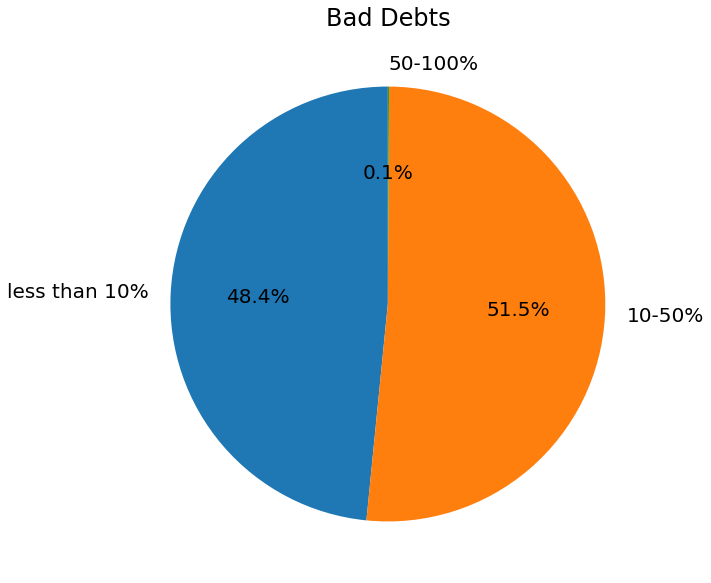

In [33]:
# Visualization 2:
plt.figure(figsize=(10,10))
mlb.rcParams.update({'font.size': 20})
data_debt['bins_bad_debt'] = pd.cut(data_debt['Bad_debt'],bins=[0,0.1,.5,1], labels=["less than 10%","10-50%","50-100%"])
data_debt.groupby(['bins_bad_debt']).size().plot(kind='pie',subplots=True,startangle=90, autopct='%1.1f%%')
plt.title('Bad Debts',)
plt.ylabel("")
plt.show()

### d) Create Box and whisker plot and analyze the distribution for 2nd mortgage, home equity, good debt, and bad debt for different cities

In [34]:
Col_list = ['second_mortgage', 'home_equity', 'Good_debt', 'Bad_debt']
city_list = data['city'].value_counts()[:25].index

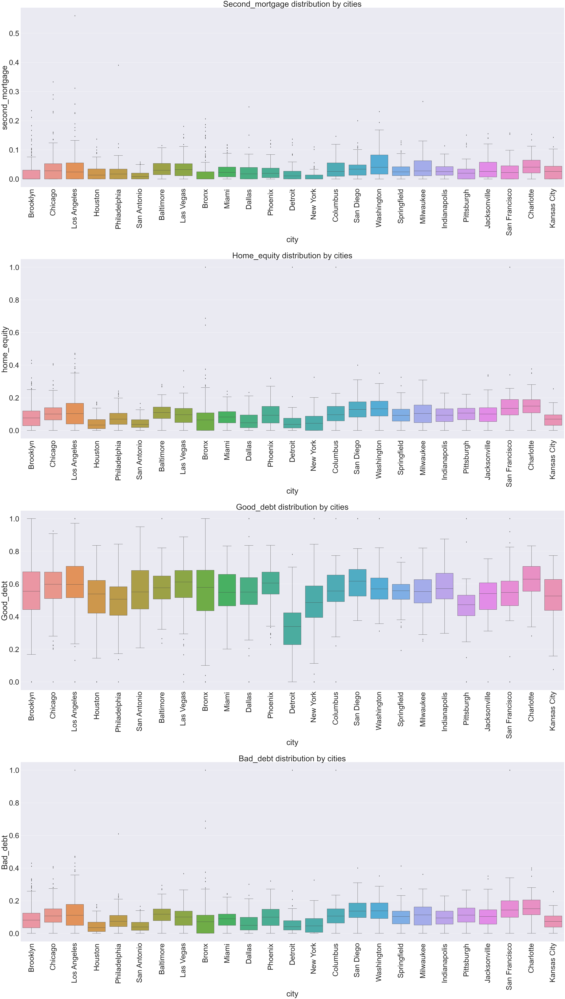

In [35]:
plt.figure(figsize=(60,125))
sns.set(font_scale=5)
plt.xticks(rotation=90)
for j,i in enumerate(Col_list):
    ax=plt.subplot(5,1,j+1)
    sns.boxplot(x='city',y=i,data=data_debt,order=city_list,ax=ax)
    plt.xticks(rotation=90)
    plt.title(f"{i.capitalize()} distribution by cities")
plt.tight_layout()
plt.show()

### e) Create a collated income distribution chart for family income, house hold income, and remaining income

In [36]:
data_debt['Remaining_income'] = data_debt['family_mean']-data_debt['hi_mean']

In [37]:
data_debt.head(3)

,state,city,place,type,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced,Bad_debt,Good_debt,bins_bad_debt,Remaining_income
UID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
267822,New York,Hamilton,Hamilton,City,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.00000,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770,0.09408,0.43555,less than 10%,4868.86384
246444,Indiana,South Bend,Roseland,City,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.00000,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030,0.04274,0.56581,less than 10%,8738.17744
245683,Indiana,Danville,Danville,City,39.792202,-86.515246,69561595.0,284193,6881,3643,3238,742.77365,703.0,323.39011,291.85520,378.0,0.95238,0.88624,0.79630,0.66667,0.39153,0.39153,0.28307,0.15873,459,378,84942.68317,74964.0,56811.62186,1155.20980,2488.0,95262.51431,85395.0,49292.67664,709.74925,1889.0,1506.06758,1361.0,731.89394,699.41354,1491.0,556.45986,532.0,184.42175,538.0,323.35354,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.94288,0.94616,0.93952,39.38154,40.83333,22.89769,888.29730,3643.0,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657,0.09512,0.63972,less than 10%,10319.83114


In [38]:
Income = data_debt[['family_mean','hi_mean','Remaining_income']]
Income.head()

,family_mean,hi_mean,Remaining_income
UID,,,
267822,67994.14790,63125.28406,4868.86384
246444,50670.10337,41931.92593,8738.17744
245683,95262.51431,84942.68317,10319.83114
279653,56401.68133,48733.67116,7668.01017
247218,54053.42396,31834.15466,22219.26930


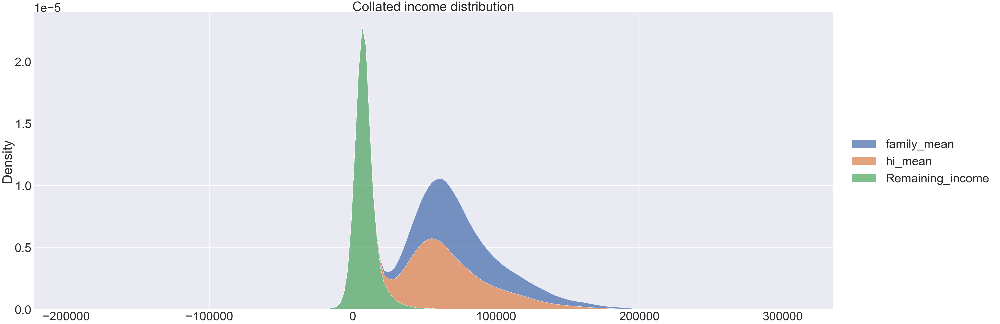

In [39]:
sns.set(font_scale=5)
sns.displot(data=Income,kind='kde',multiple="stack",height=22,aspect=2.5)
plt.title('Collated income distribution')
plt.show()

### Project Task: Week 2
Exploratory Data Analysis (EDA):

1. Perform EDA and come out with insights into population density and age. You may have to derive new fields (make sure to weight averages for accurate measurements):

a) Use pop and ALand variables to create a new field called population density

b) Use male_age_median, female_age_median, male_pop, and female_pop to create a new field called median age c) Visualize the findings using appropriate chart type

2. Create bins for population into a new variable by selecting appropriate class interval so that the number of categories don’t exceed 5 for the ease of analysis.

a) Analyze the married, separated, and divorced population for these population brackets

b) Visualize using appropriate chart type

3. Please detail your observations for rent as a percentage of income at an overall level, and for different states.

4. Perform correlation analysis for all the relevant variables by creating a heatmap. Describe your findings.

Perform EDA and come out with insights into population density and age. You may have to derive new fields (make sure to weight averages for accurate measurements):

In [40]:
density_df = data_debt[['state', 'city', 'place', 'ALand', 'pop', 'male_age_median', 'female_age_median', 'male_pop', 'female_pop']]
density_df.head(2)

,state,city,place,ALand,pop,male_age_median,female_age_median,male_pop,female_pop
UID,,,,,,,,,
267822,New York,Hamilton,Hamilton,202183361.0,5230,44.0,45.33333,2612,2618
246444,Indiana,South Bend,Roseland,1560828.0,2633,32.0,37.58333,1349,1284


a) Use pop and ALand variables to create a new field called population density

In [41]:
density_df['pop_density'] = density_df['pop'] / density_df['ALand']
density_df.head(2)

,state,city,place,ALand,pop,male_age_median,female_age_median,male_pop,female_pop,pop_density
UID,,,,,,,,,,
267822,New York,Hamilton,Hamilton,202183361.0,5230,44.0,45.33333,2612,2618,0.000026
246444,Indiana,South Bend,Roseland,1560828.0,2633,32.0,37.58333,1349,1284,0.001687


b) Use male_age_median, female_age_median, male_pop, and female_pop to create a new field called median age

In [42]:
density_df['median_age'] = ((density_df['male_age_median'] *  density_df['male_pop']) + (density_df['female_age_median'] *  density_df['female_pop'])) / density_df['pop']
density_df.head(2)

,state,city,place,ALand,pop,male_age_median,female_age_median,male_pop,female_pop,pop_density,median_age
UID,,,,,,,,,,,
267822,New York,Hamilton,Hamilton,202183361.0,5230,44.0,45.33333,2612,2618,0.000026,44.667430
246444,Indiana,South Bend,Roseland,1560828.0,2633,32.0,37.58333,1349,1284,0.001687,34.722748


c) Visualize the findings using appropriate chart type

In [43]:
high_pop_places=density_df.nlargest(200,'pop_density').sort_values(by=['pop_density','place'],ascending=False)['place'].unique().tolist()
low_pop_places=density_df.nsmallest(200,'pop_density').sort_values(by=['pop_density'],ascending=True)['place'].unique().tolist()

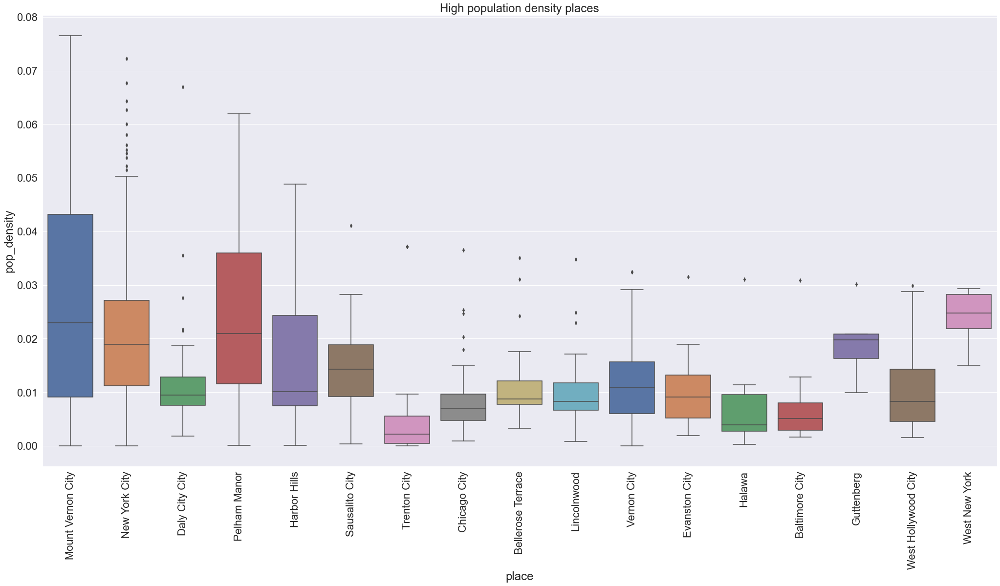

In [44]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 17))
color_pal = plt.rcParams['axes.prop_cycle'].by_key()['color']
sns.set(font_scale=2)
plt.xticks(rotation=90)
plt.title('High population density places')
sns.boxplot(x = 'place', y = 'pop_density', data=density_df, palette=color_pal, 
order = high_pop_places)
plt.show()


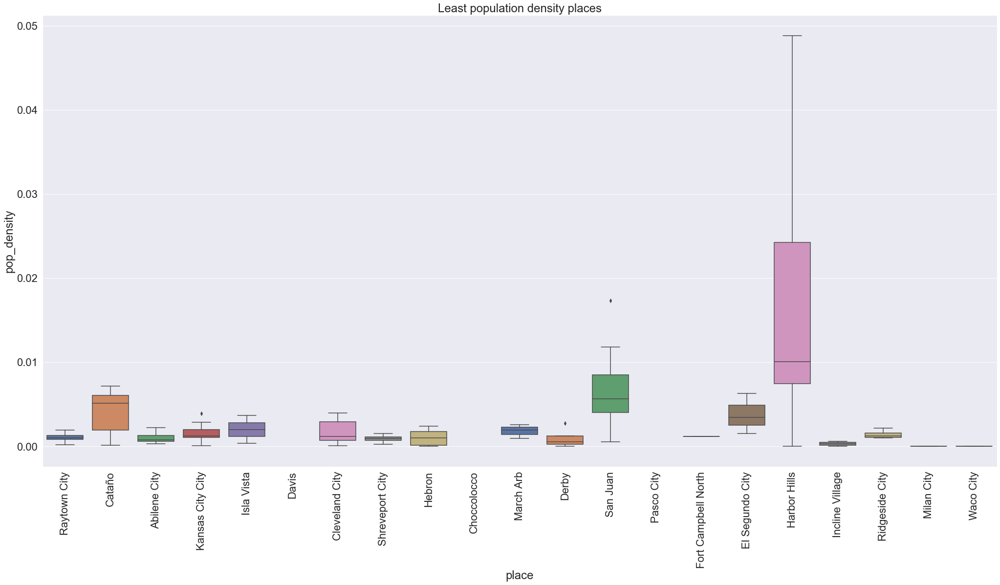

In [45]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 17))
color_pal = plt.rcParams['axes.prop_cycle'].by_key()['color']
sns.set(font_scale=2)
plt.xticks(rotation=90)
plt.title('Least population density places')
sns.boxplot(x = 'place', y = 'pop_density', data=density_df, palette=color_pal, 
order = ['Raytown City', 'Cataño', 'Abilene City', 'Kansas City City', 'Isla Vista',
 'Davis', 'Cleveland City', 'Shreveport City', 'Hebron', 'Choccolocco', 'March Arb',
 'Derby', 'San Juan', 'Pasco City', 'Fort Campbell North', 'El Segundo City',
 'Harbor Hills', 'Incline Village', 'Ridgeside City', 'Milan City', 'Waco City'])
plt.show()


In [47]:
old_medianAge_places=density_df.nlargest(200,'median_age').sort_values(by=['median_age'],ascending=False)['state'].unique().tolist()
young_medianAge_places=density_df.nsmallest(200,'median_age').sort_values(by=['median_age'],ascending=True)['state'].unique().tolist()

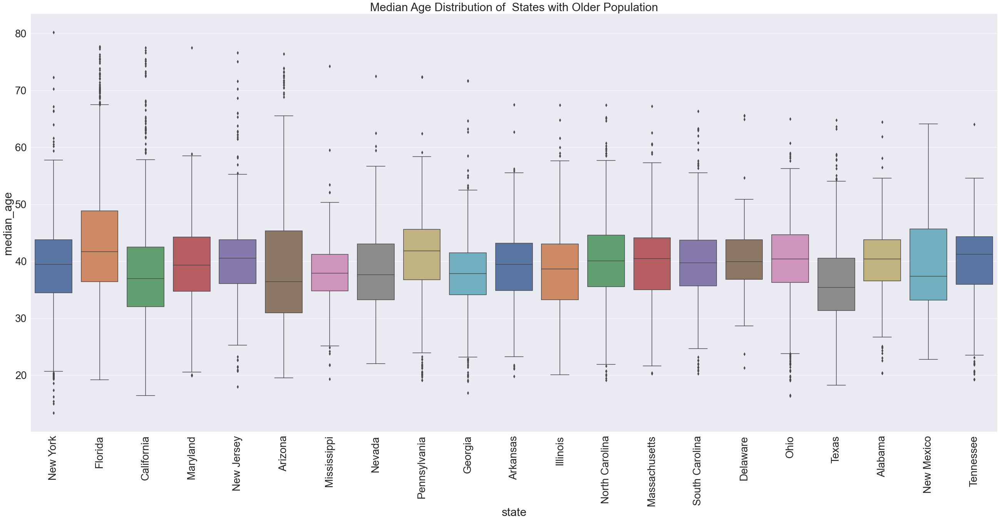

In [48]:
sns.set_style("whitegrid")
plt.figure(figsize = (45, 20))
sns.set(font_scale=2.5)
plt.xticks(rotation=90)
ax = sns.boxplot(x = 'state', y = 'median_age', data=density_df, palette=color_pal, 
            order = old_medianAge_places
           ).set_title('Median Age Distribution of  States with Older Population', fontsize = 30)

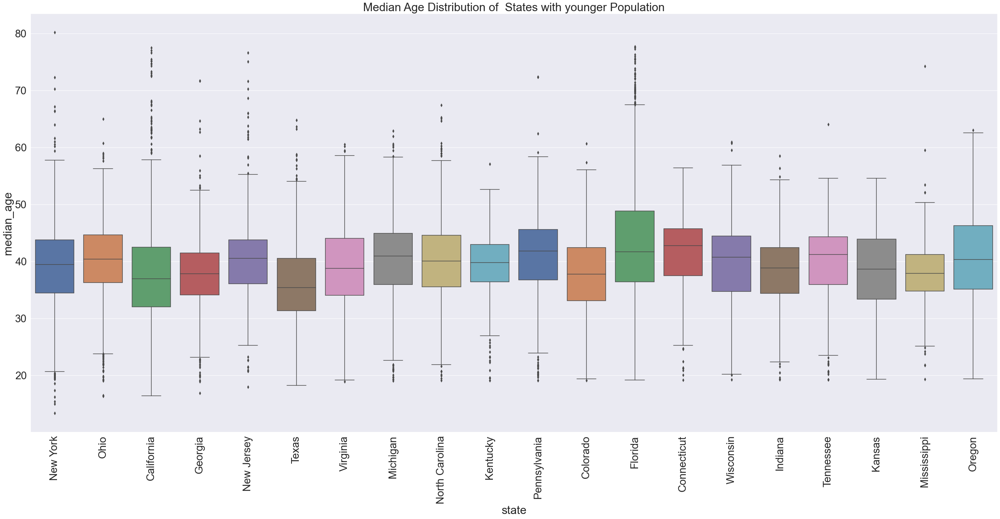

In [49]:
sns.set_style("whitegrid")
plt.figure(figsize = (45, 20))
sns.set(font_scale=2.5)
plt.xticks(rotation=90)
ax = sns.boxplot(x = 'state', y = 'median_age', data=density_df, palette=color_pal, 
            order = young_medianAge_places[:20]
           ).set_title('Median Age Distribution of  States with younger Population', fontsize = 30)

2. Create bins for population into a new variable by selecting appropriate class interval so that the number of categories don’t exceed 5 for the ease of analysis.
a) Analyze the married, separated, and divorced population for these population brackets
b) Visualize using appropriate chart type

In [50]:
age_df = data_debt[['state', 'city', 'place', 'pop', 'male_pop', 'female_pop', 'male_age_median', 'female_age_median', 'married', 'separated', 'divorced']]

In [51]:
bins = [0, 12, 18, 35, 55, 130]
labels = ['kids', 'Youth', 'Young Adult', 'Adult', 'Senior']

In [52]:
age_df['male_population_bracket']=pd.cut(age_df['male_age_median'],bins=bins,labels=labels)
age_df['female_population_bracket']=pd.cut(age_df['female_age_median'],bins=bins,labels=labels)

In [53]:
age_df.head(3)

,state,city,place,pop,male_pop,female_pop,male_age_median,female_age_median,married,separated,divorced,male_population_bracket,female_population_bracket
UID,,,,,,,,,,,,,
267822,New York,Hamilton,Hamilton,5230,2612,2618,44.00000,45.33333,0.57851,0.01240,0.08770,Adult,Adult
246444,Indiana,South Bend,Roseland,2633,1349,1284,32.00000,37.58333,0.34886,0.01426,0.09030,Young Adult,Adult
245683,Indiana,Danville,Danville,6881,3643,3238,40.83333,42.83333,0.64745,0.01607,0.10657,Adult,Adult


In [54]:
max_male_median_age = age_df.nlargest(300,'male_age_median').sort_values(by='male_age_median')['state'].unique().tolist()
max_female_median_age = age_df.nlargest(300,'female_age_median').sort_values(by='female_age_median')['state'].unique().tolist()
least_male_median_age = age_df.nsmallest(300,'male_age_median').sort_values(by='male_age_median')['state'].unique().tolist()
least_female_median_age = age_df.nsmallest(300,'female_age_median').sort_values(by='female_age_median')['state'].unique().tolist()


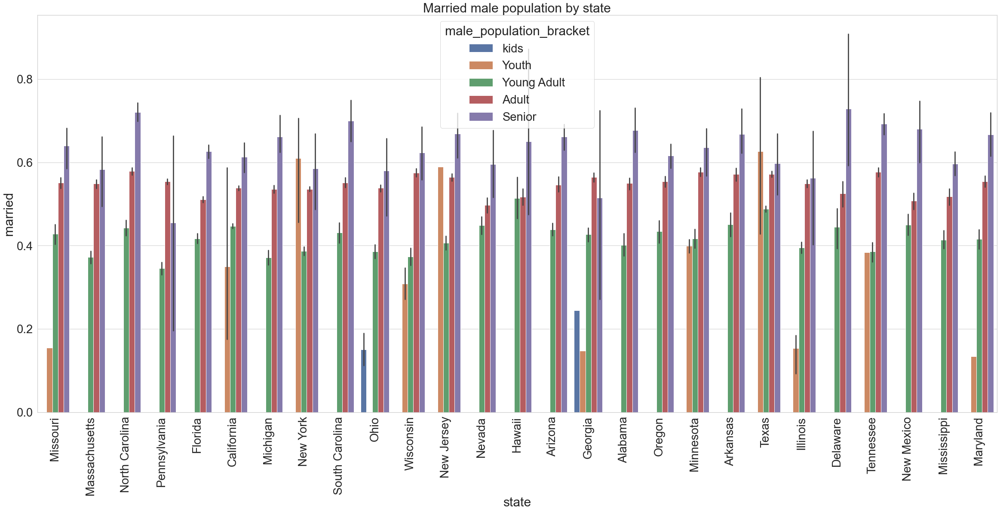

In [55]:
sns.set_style("whitegrid")
plt.figure(figsize = (40, 17))
plt.xticks(rotation=90)
sns.barplot(x='state',y='married',hue='male_population_bracket',data=age_df,
            order=max_male_median_age[:30]).set_title('Married male population by state')
plt.show()

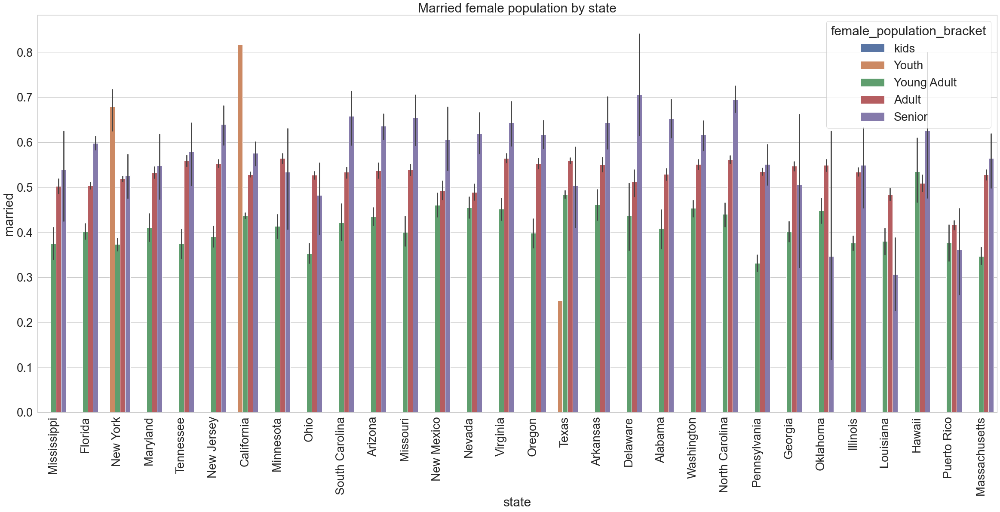

In [56]:
sns.set_style("whitegrid")
plt.figure(figsize = (40, 17))
plt.xticks(rotation=90)
sns.barplot(x='state',y='married',hue='female_population_bracket',data=age_df,
            order=max_female_median_age[:30]).set_title('Married female population by state')
plt.show()

California has highest female married youth population

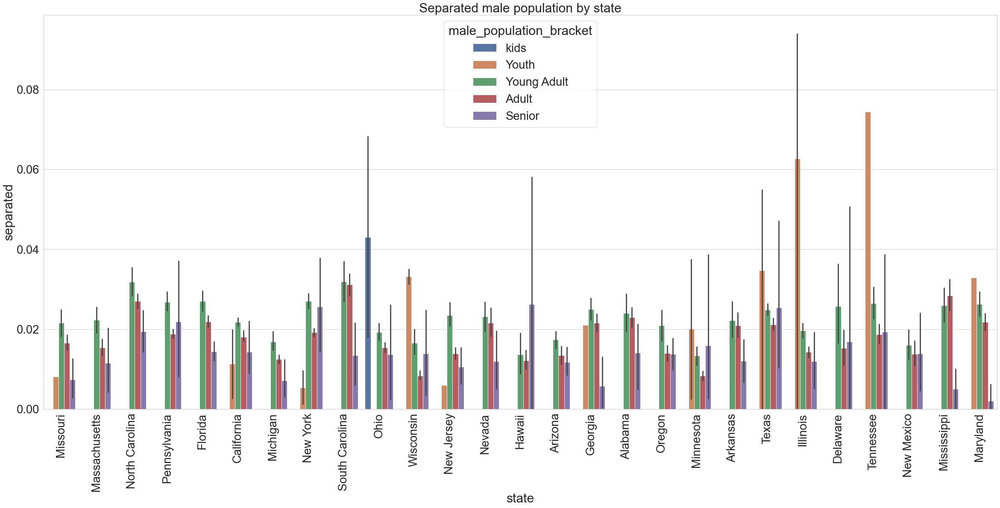

In [57]:
sns.set_style("whitegrid")
plt.figure(figsize = (40, 17))
plt.xticks(rotation=90)
sns.barplot(x='state',y='separated',hue='male_population_bracket',data=age_df,
            order=max_male_median_age[:30]).set_title('Separated male population by state')
plt.show()

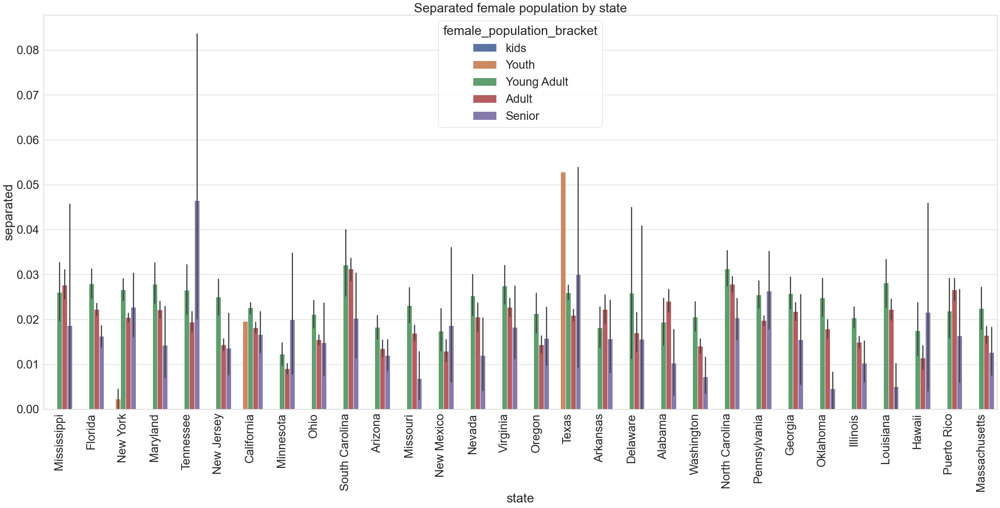

In [58]:
sns.set_style("whitegrid")
plt.figure(figsize = (40, 17))
plt.xticks(rotation=90)
sns.barplot(x='state',y='separated',hue='female_population_bracket',data=age_df,
            order=max_female_median_age[:30]).set_title('Separated female population by state')
plt.show()

Tennessee has highest separated Seniors and Texas has highest separated youths

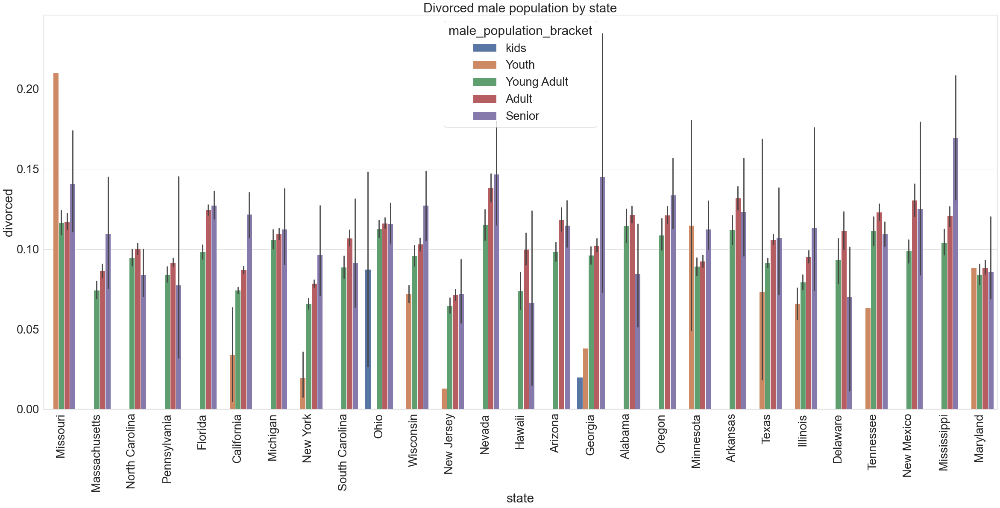

In [59]:
sns.set_style("whitegrid")
plt.figure(figsize = (40, 17))
plt.xticks(rotation=90)
sns.barplot(x='state',y='divorced',hue='male_population_bracket',data=age_df,
            order=max_male_median_age[:30]).set_title('Divorced male population by state')
plt.show()

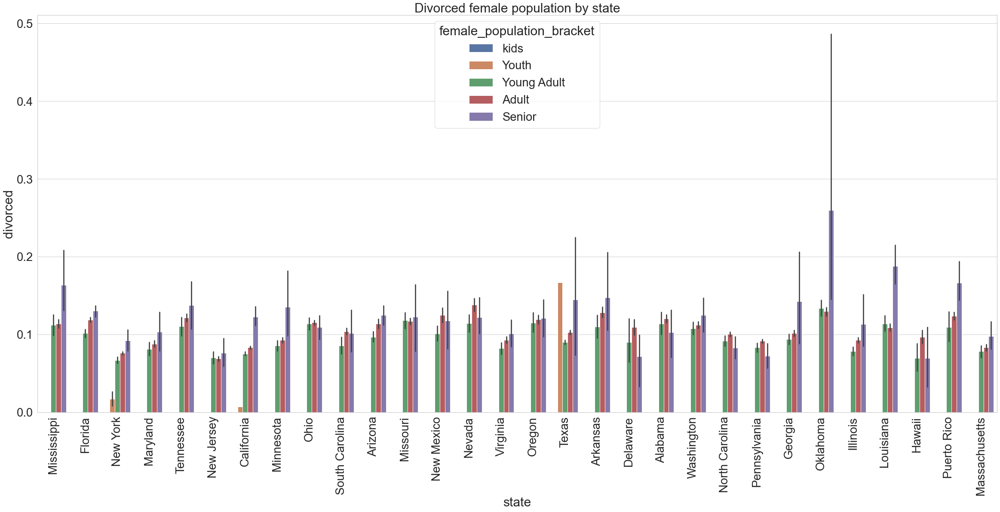

In [60]:
sns.set_style("whitegrid")
plt.figure(figsize = (40, 17))
plt.xticks(rotation=90)
sns.barplot(x='state',y='divorced',hue='female_population_bracket',data=age_df,
            order=max_female_median_age[:30]).set_title('Divorced female population by state')
plt.show()

3. Please detail your observations for rent as a percentage of income at an overall level, and for different states.

In [61]:
rent_df = data_debt[['state', 'city', 'rent_median', 'hi_median', 'family_median']]
Overall_rent_percentage = (rent_df['rent_median'].sum() / rent_df['hi_median'].sum()) * 100
print('Overall rent as a percentage of overall household income is around', round(Overall_rent_percentage,2),"%")

Overall rent as a percentage of overall household income is around 1.75 %


In [62]:
rent_df['overall_rent_pcnt'] = round((rent_df['rent_median'] / rent_df['hi_median']) * 100, 2)
rent_df.head()

,state,city,rent_median,hi_median,family_median,overall_rent_pcnt
UID,,,,,,
267822,New York,Hamilton,784.0,48120.0,53245.0,1.63
246444,Indiana,South Bend,848.0,35186.0,43023.0,2.41
245683,Indiana,Danville,703.0,74964.0,85395.0,0.94
279653,Puerto Rico,San Juan,782.0,37845.0,44399.0,2.07
247218,Kansas,Manhattan,881.0,22497.0,50272.0,3.92


In [63]:
#List of top 200 states by it overall rent percentage
Rent_of_states=rent_df.nlargest(200,'overall_rent_pcnt')['state'].unique().tolist()

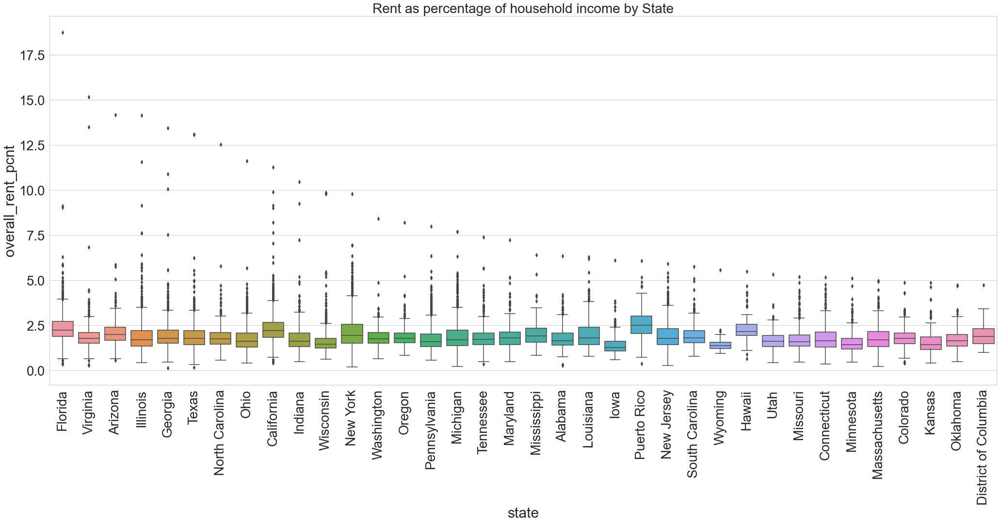

In [64]:
sns.set_style("whitegrid")
plt.figure(figsize = (35, 14))
plt.xticks(rotation=90)
sns.boxplot(x = 'state', y = 'overall_rent_pcnt', data=rent_df, order = Rent_of_states[:40]).set_title(
    'Rent as percentage of household income by State', fontsize = 28)
plt.show()


4. Perform correlation analysis for all the relevant variables by creating a heatmap. Describe your findings.

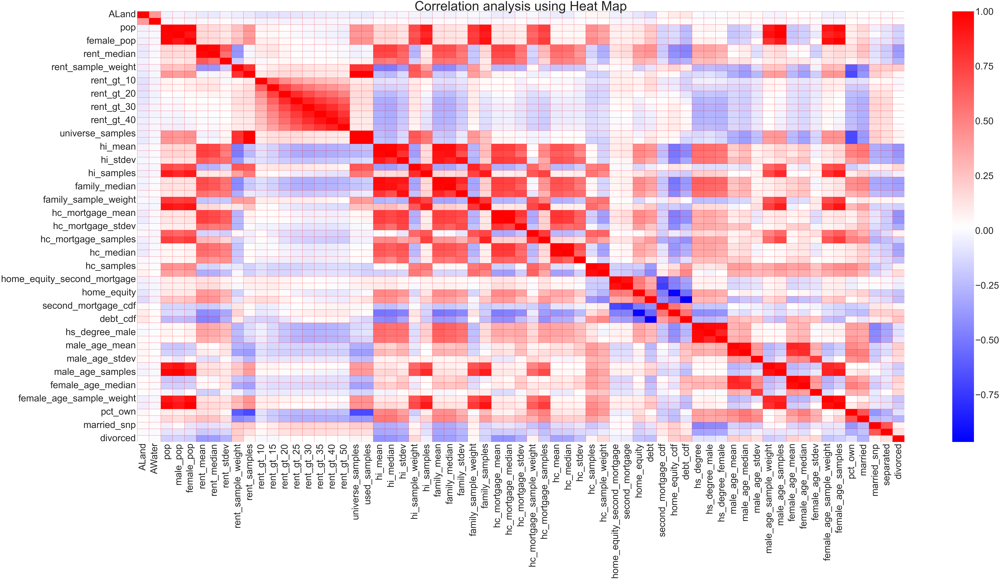

In [65]:
sns.set_style("whitegrid")

corr = train_df.loc[:,~train_df.columns.isin(['lat','lng'])].corr()
plt.figure(figsize=(130,60))
sns.set(font_scale=6.5)
sns.heatmap(corr, cmap="bwr", linewidths=1, linecolor='red').set_title('Correlation analysis using Heat Map', fontsize = 100)
plt.grid('on', )
plt.show()

### Project Task: Week 3
Data Pre-processing:

1. The economic multivariate data has a significant number of measured variables. The goal is to find where the measured variables depend on a number of smaller unobserved common factors or latent variables. 2. Each variable is assumed to be dependent upon a linear combination of the common factors, and the coefficients are known as loadings. Each measured variable also includes a component due to independent      random variability, known as “specific variance” because it is specific to one variable. Obtain the common factors and then plot the loadings. Use factor analysis to find latent variables in our dataset and gain          insight into the linear relationships in the data. Following are the list of latent variables:

• Highschool graduation rates • Median population age • Second mortgage statistics • Percent own • Bad debt
expense


In [66]:
fact_Analysis = FactorAnalysis(n_components=5)
factor = fact_Analysis.fit_transform(train_df.select_dtypes(exclude='object'))
factor

array([[-0.00667611,  0.07492126, -0.36015787,  0.23824767, -0.49772862],
       [-0.04814493, -0.08896681, -0.87864522,  0.38350825,  0.9595161 ],
       [-0.03553662, -0.03235913,  0.50181322,  0.56799945,  0.39064215],
       ...,
       [ 0.25312567,  0.97020792,  0.43371968,  0.37565594,  0.38188459],
       [-0.04492615, -0.07477529,  3.1568678 ,  0.57346015,  0.17109597],
       [-0.04746265, -0.08342968, -0.72716377,  0.20840808, -0.42350843]])

In [67]:
#Transforming categorical variable into nummeric
le=LabelEncoder()
for col in train_df.select_dtypes(include=('object')):
    train_df[col]=le.fit_transform(train_df[col])

    
for col in test_df.select_dtypes(include=('object')):
    test_df[col]=le.fit_transform(test_df[col])

In [68]:
test_df[:3]

,state,city,place,type,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
UID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
255504,22,945,1210,1,42.346422,-83.252823,2711280.0,39555,3417,1479,1938,858.57169,859.0,232.39082,276.07497,424.0,1.00000,0.95696,0.85316,0.85316,0.85316,0.85316,0.76962,0.63544,435,395,48899.52121,38746.0,44392.20902,798.02401,1180.0,53802.87122,45167.0,43756.56479,464.30972,769.0,1139.24548,1109.0,336.47710,262.67011,474.0,488.51323,436.0,192.75147,271.0,189.18182,0.06443,0.06443,0.07651,0.63624,0.14111,0.55087,0.51965,0.91047,0.92010,0.90391,33.37131,27.83333,22.36768,334.30978,1479.0,34.78682,33.75000,21.58531,416.48097,1938.0,0.70252,0.28217,0.05910,0.03813,0.14299
252676,19,160,200,2,44.100724,-70.257832,14778785.0,2705204,3796,1846,1950,832.68625,750.0,267.22342,183.32299,245.0,1.00000,1.00000,0.86611,0.67364,0.30962,0.30962,0.30962,0.27197,275,239,72335.33234,61008.0,51895.81159,922.82969,1722.0,85642.22095,74759.0,49156.72870,482.99945,1147.0,1533.25988,1438.0,536.61118,373.96188,937.0,661.31296,668.0,201.31365,510.0,279.69697,0.01175,0.01175,0.14375,0.64755,0.52310,0.26442,0.49359,0.94290,0.92832,0.95736,43.88680,46.08333,22.90302,427.10824,1846.0,44.23451,46.66667,22.37036,532.03505,1950.0,0.85128,0.64221,0.02338,0.00000,0.13377
276314,38,3009,3282,0,41.948556,-76.783808,258903666.0,863840,3944,2065,1879,816.00639,755.0,416.25699,141.39063,217.0,0.97573,0.93204,0.78641,0.71845,0.63592,0.47573,0.43689,0.32524,245,206,58501.15901,51648.0,45245.27248,893.07759,1461.0,65694.06582,57186.0,44239.31893,619.73962,1084.0,1254.54462,1089.0,596.85204,340.45884,552.0,397.44466,356.0,189.40372,664.0,534.16737,0.01069,0.01316,0.06497,0.45395,0.51066,0.60484,0.83848,0.89238,0.86003,0.92463,39.81661,41.91667,24.29111,499.10080,2065.0,41.62426,44.50000,22.86213,453.11959,1879.0,0.81897,0.59961,0.01746,0.01358,0.10026


In [69]:
train_df[:3]

,state,city,place,type,lat,lng,ALand,AWater,pop,male_pop,female_pop,rent_mean,rent_median,rent_stdev,rent_sample_weight,rent_samples,rent_gt_10,rent_gt_15,rent_gt_20,rent_gt_25,rent_gt_30,rent_gt_35,rent_gt_40,rent_gt_50,universe_samples,used_samples,hi_mean,hi_median,hi_stdev,hi_sample_weight,hi_samples,family_mean,family_median,family_stdev,family_sample_weight,family_samples,hc_mortgage_mean,hc_mortgage_median,hc_mortgage_stdev,hc_mortgage_sample_weight,hc_mortgage_samples,hc_mean,hc_median,hc_stdev,hc_samples,hc_sample_weight,home_equity_second_mortgage,second_mortgage,home_equity,debt,second_mortgage_cdf,home_equity_cdf,debt_cdf,hs_degree,hs_degree_male,hs_degree_female,male_age_mean,male_age_median,male_age_stdev,male_age_sample_weight,male_age_samples,female_age_mean,female_age_median,female_age_stdev,female_age_sample_weight,female_age_samples,pct_own,married,married_snp,separated,divorced
UID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
267822,32,2514,3603,2,42.840812,-75.501524,202183361.0,1699120,5230,2612,2618,769.38638,784.0,232.63967,272.34441,362.0,0.86761,0.79155,0.59155,0.45634,0.42817,0.18592,0.15493,0.12958,387,355,63125.28406,48120.0,49042.01206,1290.96240,2024.0,67994.14790,53245.0,47667.30119,884.33516,1491.0,1414.80295,1223.0,641.22898,377.83135,867.0,570.01530,558.0,270.11299,770.0,499.29293,0.01588,0.02077,0.08919,0.52963,0.43658,0.49087,0.73341,0.89288,0.85880,0.92434,42.48574,44.00000,22.97306,696.42136,2612.0,44.48629,45.33333,22.51276,685.33845,2618.0,0.79046,0.57851,0.01882,0.01240,0.08770
246444,14,5750,7571,2,41.701441,-86.266614,1560828.0,100363,2633,1349,1284,804.87924,848.0,253.46747,312.58622,513.0,0.97410,0.93227,0.69920,0.69920,0.55179,0.41235,0.39044,0.27888,542,502,41931.92593,35186.0,31639.50203,838.74664,1127.0,50670.10337,43023.0,34715.57548,375.28798,554.0,864.41390,784.0,482.27020,316.88320,356.0,351.98293,336.0,125.40457,229.0,189.60606,0.02222,0.02222,0.04274,0.60855,0.42174,0.70823,0.58120,0.90487,0.86947,0.94187,34.84728,32.00000,20.37452,323.90204,1349.0,36.48391,37.58333,23.43353,267.23367,1284.0,0.52483,0.34886,0.01426,0.01426,0.09030
245683,14,1471,2090,2,39.792202,-86.515246,69561595.0,284193,6881,3643,3238,742.77365,703.0,323.39011,291.85520,378.0,0.95238,0.88624,0.79630,0.66667,0.39153,0.39153,0.28307,0.15873,459,378,84942.68317,74964.0,56811.62186,1155.20980,2488.0,95262.51431,85395.0,49292.67664,709.74925,1889.0,1506.06758,1361.0,731.89394,699.41354,1491.0,556.45986,532.0,184.42175,538.0,323.35354,0.00000,0.00000,0.09512,0.73484,1.00000,0.46332,0.28704,0.94288,0.94616,0.93952,39.38154,40.83333,22.89769,888.29730,3643.0,42.15810,42.83333,23.94119,707.01963,3238.0,0.85331,0.64745,0.02830,0.01607,0.10657


In [70]:
# Splitting independent and dependent variables for model training
train_X = train_df.drop(columns=['hc_mortgage_mean','lat','lng'])
train_y = train_df['hc_mortgage_mean']

test_X = test_df.drop(columns=['hc_mortgage_mean','lat','lng'])
test_y = test_df['hc_mortgage_mean']

In [72]:
# Scaling the variables to normalize the data in a same range
sc=StandardScaler()
X_train_scalled=sc.fit_transform(train_X)

X_test_scalled=sc.transform(test_X)

In [73]:
# Liner regression model building
lr=LinearRegression()
lr_model=lr.fit(X_train_scalled,train_y)
lr_model

LinearRegression()

In [74]:
# Predicting the target values for independent variables of test dataset 
y_predicted=lr_model.predict(X_test_scalled)
y_predicted

array([1141.66093164, 1515.78504125, 1219.52892019, ..., 1856.31830336,
       1168.45725636, 1389.56186045])

In [75]:
print("Overall R2 score of the Linear Regression model is",round(r2_score(test_y,y_predicted)*100,2),"%")
print("Overall RMSE of linear regression model is",np.sqrt(mean_squared_error(test_y,y_predicted)))

Overall R2 score of the Linear Regression model is 98.72 %
Overall RMSE of linear regression model is 71.24064101444351


### The above Linear regression model has the high accuracy score of 98.72% and RMSE of 71.24

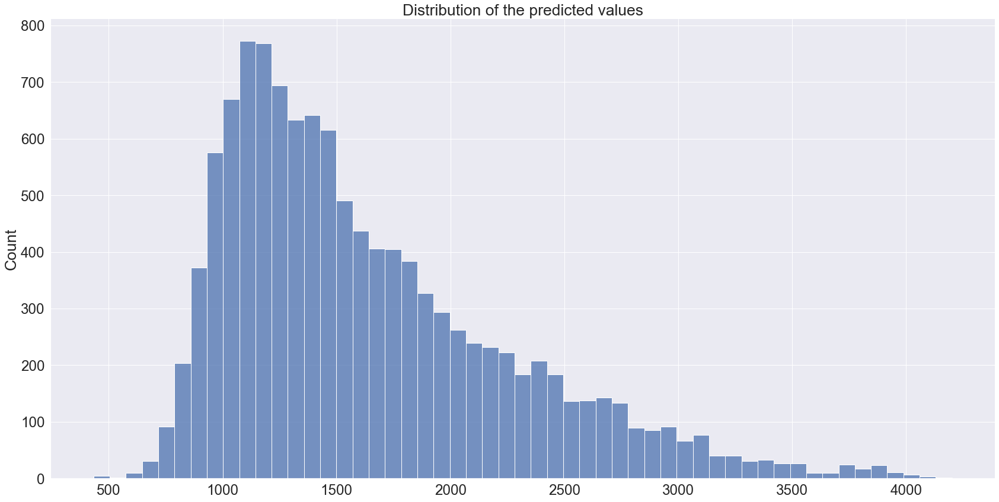

In [76]:
# Ploting the distribution of the values predicted by the linear regression model
sns.set(font_scale=2.2)
ax=sns.displot(y_predicted,height=12,aspect=2)
plt.title('Distribution of the predicted values')
plt.show()

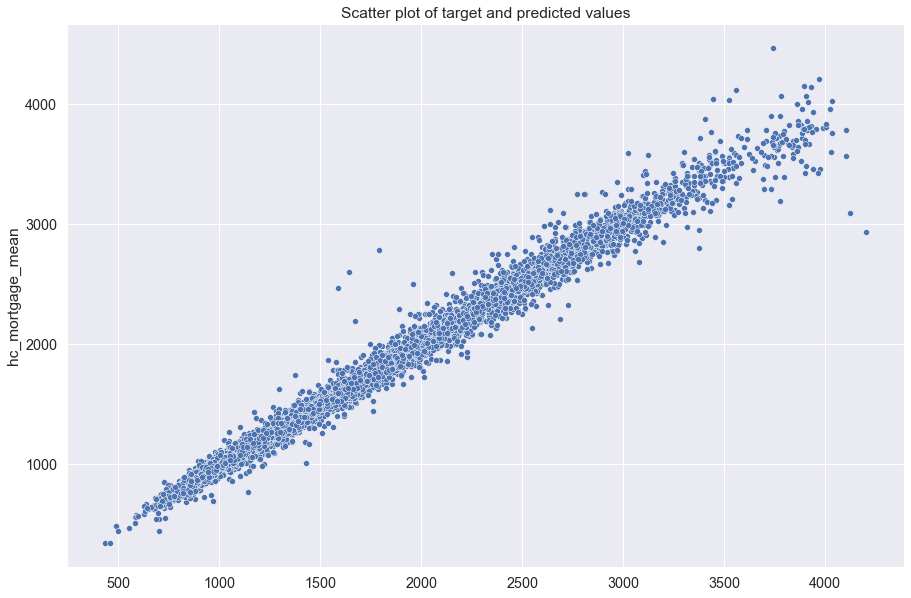

In [77]:
# Scatter plot of actual and predicted values
plt.figure(figsize=(15,10))
sns.set(font_scale=1.3)
sns.scatterplot(x=y_predicted,y=test_y).set_title('Scatter plot of target and predicted values')
plt.show()

### From the above scatter plot we note that the actual and the predicted values are very closer with the minimal residual/error.